In [1]:
from icevision.all import *
from fastai.callback.wandb import *

# To load annotations artifacts versioned on wandb
# import wandb
# run = wandb.init()
# artifact = run.use_artifact('dnth/data-flywheel/xmls:v0', type='annotations')
# artifact_dir = artifact.download()

run = wandb.init(project="data-flywheel-person", name="Fix 3", reinit=True)

INFO     - The mmdet config folder already exists. No need to downloaded it. Path : /root/.icevision/mmdetection_configs/mmdetection_configs-2.20.1/configs | icevision.models.mmdet.download_configs:download_mmdet_configs:17
03/14/2024 17:24:38 - ERROR - wandb.jupyter -   Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: dnth. Use `wandb login --relogin` to force relogin


## Log Annotations

In [2]:
artifact = wandb.Artifact("xmls", type="annotations")
artifact.add_dir("pascal_voc_annotations/")
wandb.log_artifact(artifact)

wandb: Adding directory to artifact (./pascal_voc_annotations)... Done. 2.9s


<Artifact xmls>

## Load Annotations

In [3]:
parser = parsers.VOCBBoxParser(annotations_dir='pascal_voc_annotations/', 
                               images_dir='/workspace/yolo_v8_training/oiv7_full/validation/')

In [4]:
# Parse annotations to create records
train_records, valid_records = parser.parse() # Defaults to 80:20 split
parser.class_map

  0%|          | 0/13113 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/13113 [00:00<?, ?it/s]

WARNING  - (record_id: 008216e31b1aecf0) - 🚫 Record could not be autofixed and will be removed because: File '/workspace/yolo_v8_training/oiv7_full/validation/008216e31b1aecf0.xml' does not exist | icevision.core.record:autofix_records:100
WARNING  - (record_id: 00fd93edd4717826) - 🚫 Record could not be autofixed and will be removed because: File '/workspace/yolo_v8_training/oiv7_full/validation/00fd93edd4717826.xml' does not exist | icevision.core.record:autofix_records:100
WARNING  - (record_id: 0660c06266751279) - 🚫 Record could not be autofixed and will be removed because: File '/workspace/yolo_v8_training/oiv7_full/validation/0660c06266751279.xml' does not exist | icevision.core.record:autofix_records:100
WARNING  - (record_id: 0875084906c62ddd) - 🚫 Record could not be autofixed and will be removed because: File '/workspace/yolo_v8_training/oiv7_full/validation/0875084906c62ddd.xml' does not exist | icevision.core.record:autofix_records:100
WARNING  - (record_id: 09d8aa2d19ff724d)

<ClassMap: {'background': 0, 'person': 1}>

In [5]:
image_size = 480
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=image_size, presize=640), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])

In [6]:
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

In [7]:
print(f"Train on {len(train_ds)} images")
print(f"Validate on {len(valid_ds)} images")

Train on 10423 images
Validate on 2606 images


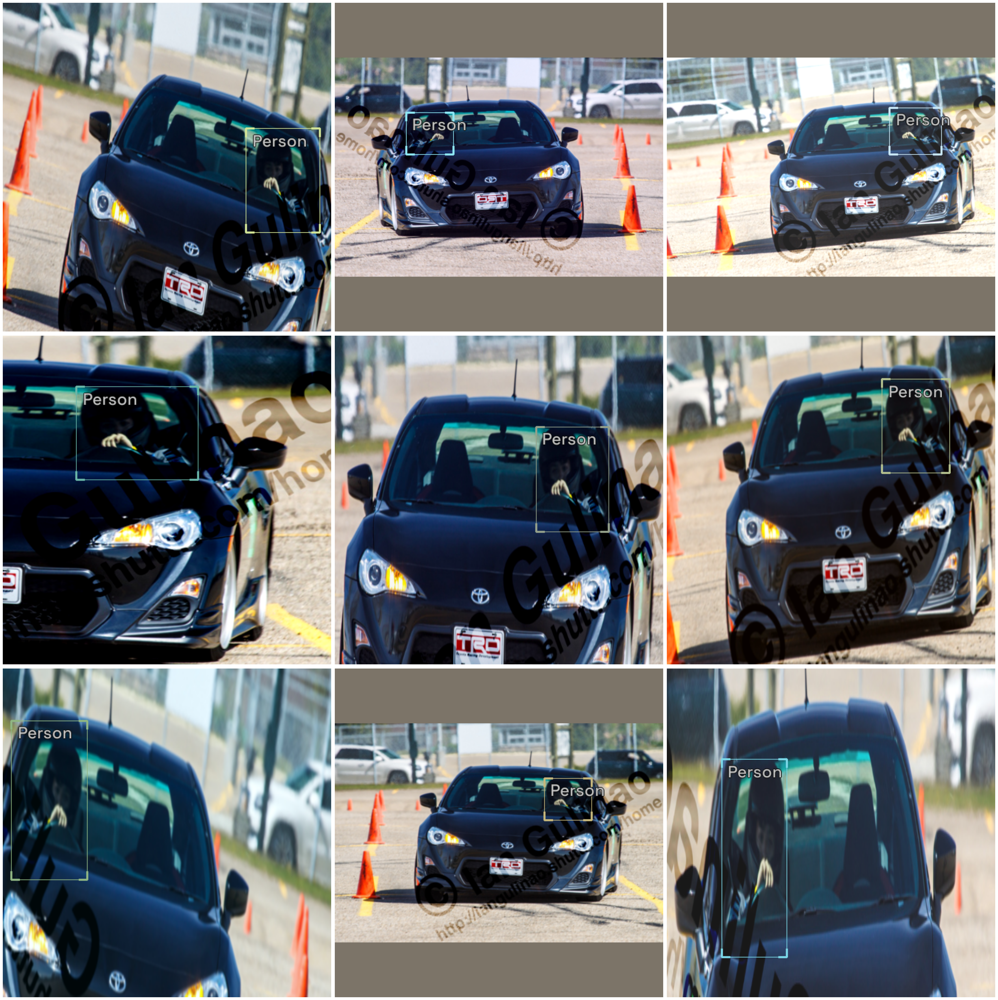

In [8]:
%matplotlib inline
# Show an element of the train_ds with augmentation transformations applied
samples = [train_ds[1] for _ in range(9)]
show_samples(samples, ncols=3)

## Build Model

In [9]:
# model_type = models.mmdet.vfnet
# backbone = model_type.backbones.resnet50_fpn_mstrain_2x
# model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(parser.class_map)) 


artifact = run.use_artifact('dnth/data-flywheel-person/vfnet-model:v0', type='trained-model-checkpoint')
artifact_dir = artifact.download()


# Load previously trained model
from icevision.models import *

# The model is automatically recreated in the evaluation mode. To unset that mode, you only need to pass `eval_mode=Fales`)
checkpoint_and_model = model_from_checkpoint('./models/model_checkpoint.pth')

model = checkpoint_and_model["model"]
model_type = checkpoint_and_model["model_type"]
class_map = checkpoint_and_model["class_map"]
img_size = checkpoint_and_model["img_size"]

load checkpoint from local path: ./models/model_checkpoint.pth


/root/miniforge-pypy3/envs/icevision/lib/python3.9/site-packages/mmdet/core/anchor/builder.py:16: UserWarning: ``build_anchor_generator`` would be deprecated soon, please use ``build_prior_generator`` 
  warnings.warn(
2024-03-14 17:25:15,632 - mmcv - INFO - initialize ResNet with init_cfg {'type': 'Pretrained', 'checkpoint': 'torchvision://resnet50'}
2024-03-14 17:25:15,632 - mmcv - INFO - load model from: torchvision://resnet50
2024-03-14 17:25:15,633 - mmcv - INFO - load checkpoint from torchvision path: torchvision://resnet50
2024-03-14 17:25:15,680 - mmcv - WARNING - The model and loaded state dict do not match exactly

unexpected key in source state_dict: fc.weight, fc.bias

2024-03-14 17:25:15,688 - mmcv - INFO - initialize FPN with init_cfg {'type': 'Xavier', 'layer': 'Conv2d', 'distribution': 'uniform'}
2024-03-14 17:25:15,702 - mmcv - INFO - initialize VFNetHead with init_cfg {'type': 'Normal', 'layer': 'Conv2d', 'std': 0.01, 'override': {'type': 'Normal', 'name': 'vfnet_cls'

In [10]:
train_dl = model_type.train_dl(train_ds, batch_size=32, num_workers=16, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=32, num_workers=16, shuffle=False)

In [11]:
# model_type.show_batch(first(valid_dl), ncols=4)

In [12]:
from fastai.callback.tracker import SaveModelCallback

In [13]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

learn = model_type.fastai.learner(dls=[train_dl, valid_dl], 
                                  model=model, 
                                  metrics=metrics,
                                  cbs=[WandbCallback(), SaveModelCallback()])

/root/miniforge-pypy3/envs/icevision/lib/python3.9/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/root/miniforge-pypy3/envs/icevision/lib/python3.9/site-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/root/miniforge-pypy3/envs/icevision/lib/python3.9/site-packages/mmdet/core/anchor/anchor_generator.py:360: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  warnings.warn(


SuggestedLRs(valley=5.248074739938602e-05)

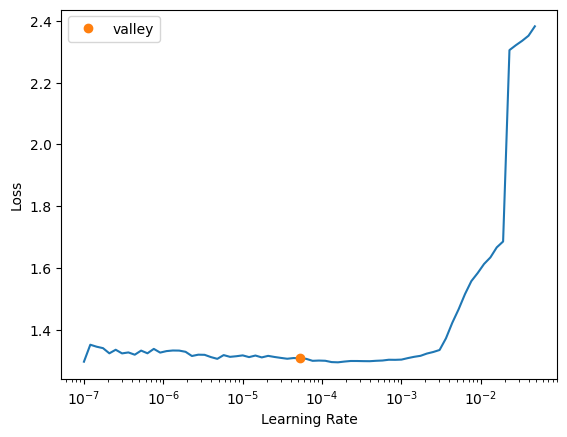

In [14]:
learn.lr_find()

In [15]:
learn.fine_tune(2, 3e-5, freeze_epochs=1)

Could not gather input dimensions
WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'Dataset' object has no attribute 'items'


epoch,train_loss,valid_loss,COCOMetric,time
0,1.311613,1.198769,0.509258,02:49


/root/miniforge-pypy3/envs/icevision/lib/python3.9/site-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/root/miniforge-pypy3/envs/icevision/lib/python3.9/site-packages/mmdet/core/anchor/anchor_generator.py:360: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  warnings.warn(


Better model found at epoch 0 with valid_loss value: 1.198769211769104.
Could not gather input dimensions


epoch,train_loss,valid_loss,COCOMetric,time
0,1.297355,1.193992,0.511417,03:02
1,1.289722,1.197436,0.508696,03:03


Better model found at epoch 0 with valid_loss value: 1.1939921379089355.


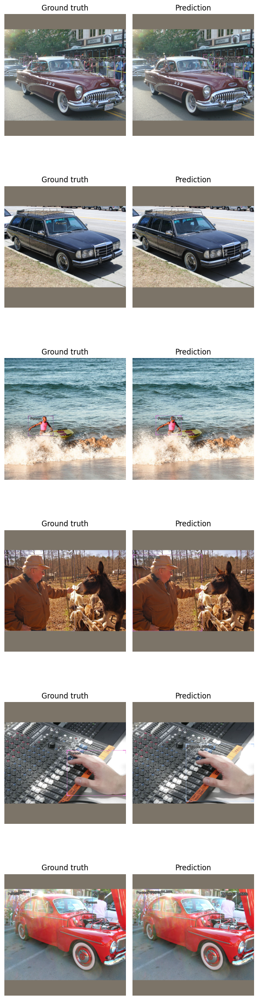

In [16]:
model_type.show_results(model, valid_ds, detection_threshold=.5)

INFO     - Losses returned by model: ['loss_cls', 'loss_bbox'] | icevision.models.interpretation:plot_top_losses:219


  0%|          | 0/2606 [00:00<?, ?it/s]

/root/miniforge-pypy3/envs/icevision/lib/python3.9/site-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/root/miniforge-pypy3/envs/icevision/lib/python3.9/site-packages/mmdet/core/anchor/anchor_generator.py:360: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  warnings.warn(


  0%|          | 0/326 [00:00<?, ?it/s]

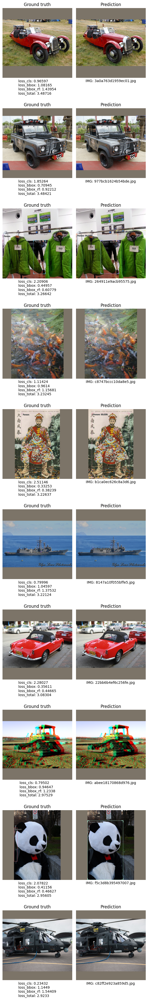

In [17]:
sorted_samples, sorted_preds, losses_stats = model_type.interp.plot_top_losses(model, valid_ds, sort_by="loss_total", n_samples=10)

## Wandb Results Logging

In [18]:
infer_dl = model_type.infer_dl(valid_ds, batch_size=8)
preds = model_type.predict_from_dl(model=model, infer_dl=infer_dl, keep_images=True)

# Create wandb_images for each prediction
wandb_images = wandb_img_preds(preds, add_ground_truth=True) 

# Log the wandb_images to wandb
wandb.log({"Predicted images from validation ds": wandb_images})

  0%|          | 0/326 [00:00<?, ?it/s]

In [19]:
wandb_images = wandb_img_preds(sorted_preds, add_ground_truth=True) 
wandb.log({"Highest loss images": wandb_images})

In [20]:
from icevision.models.checkpoint import *
save_icevision_checkpoint(model,
                        model_name='mmdet.vfnet', 
                        backbone_name='resnet50_fpn_mstrain_2x',
                        img_size=640,
                        classes=parser.class_map.get_classes(),
                        filename='./models/model_checkpoint.pth',
                        meta={'icevision_version': 'master'})

In [22]:
artifact = wandb.Artifact("vfnet-model", type="trained-model-checkpoint")
artifact.add_dir("models/")
wandb.log_artifact(artifact)

wandb: Adding directory to artifact (./models)... Done. 0.2s


<Artifact vfnet-model>

## Log Relabel List

In [23]:
to_relabel = [pred.record_id + '.xml' for pred in sorted_preds]

In [24]:
to_relabel

['3a0a763d1959ec01.xml',
 '977bcb1624b54bde.xml',
 '264911e9acb95575.xml',
 'c8747bccc10da8e5.xml',
 'b1ca0ec626c8a3d6.xml',
 '8147a10f055bffe5.xml',
 '22bb6b4ef6c256fe.xml',
 'abee18170868d976.xml',
 'f5c3d8b395497007.xml',
 'c82ff2e923a859d5.xml',
 '063e31f11b35dd98.xml',
 'f8f29c3e04a76fa3.xml',
 '51a20b0241579e25.xml',
 'f1f7ff1db85041ce.xml',
 '6172064bbb38cafb.xml',
 '97be0fd4d7d12a18.xml',
 '638d4334762fe254.xml',
 '448d7b8fa6bb9bf4.xml',
 'bf626ba35cc040e7.xml',
 'a89c90fa14a92e91.xml',
 '6a0aed8fb1b057be.xml',
 '465cc20ecb9331de.xml',
 'bd52ab70da6d767d.xml',
 'a81ed2f9176ac8b6.xml',
 '7380fabf69883769.xml',
 '897300fded8443d5.xml',
 '019347cc4772963d.xml',
 'aca989ef63fc3df9.xml',
 'cd5c85dc1cff7f92.xml',
 'facddd3b77209fcf.xml',
 'ab06a8b2cb04a390.xml',
 '1197a77c28821cff.xml',
 '1e3415312ee3bc46.xml',
 '7888e4b9082b596b.xml',
 'ca9edc80fb7772ed.xml',
 '7bf9d8a6cab7c3da.xml',
 '3cf4c3c443c0974f.xml',
 '2d7045ed113ef506.xml',
 '6f947f41a10f984b.xml',
 'ae9568bb96052fbb.xml',


In [25]:
with open('relabel_list.txt', 'w') as file:
    file.write('\n'.join(to_relabel))

In [26]:
artifact = wandb.Artifact("xml-files", type="relabel-list")
artifact.add_file("relabel_list.txt")
wandb.log_artifact(artifact)

<Artifact xml-files>

In [27]:
wandb.finish()

COCOMetric,▂█▁
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eps_1,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eps_2,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eps_3,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eps_4,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eps_5,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eps_6,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▂▂▃▄▄▅▆▇▇██▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_1,▁▁▂▂▃▄▄▅▆▇▇██▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
